<a href="https://colab.research.google.com/github/azzindani/00_Kaggle_Dataset/blob/main/Liver_Tumor_Segmentation_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 00 Import Modules

In [1]:
#!pip install -q pydicom
!command -v ffmpeg >/dev/null || (apt update && apt install -y ffmpeg)
!pip install -q mediapy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 31.6 MB/s eta 0:00:00


In [2]:
import os
import json
import nibabel as nib
import matplotlib.pyplot as plt
#import pydicom
import numpy as np
import cv2
import subprocess
import itertools
import mediapy as media

from PIL import Image
from IPython.display import Audio, Video, HTML
from matplotlib.animation import FuncAnimation
from base64 import b64encode
from io import BytesIO
from zipfile import ZipFile

## 01 Download Dataset

In [3]:
url = 'https://www.kaggle.com/datasets/andrewmvd/liver-tumor-segmentation'

url_path = url.split('datasets/')[1]
url_path

'andrewmvd/liver-tumor-segmentation'

In [4]:
!kaggle datasets download -d {url_path}

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/liver-tumor-segmentation
License(s): Attribution-NonCommercial-NoDerivatives 4.0 International (CC BY-NC-ND 4.0)
100% 4.83G/4.84G [00:46<00:00, 176MB/s]
100% 4.84G/4.84G [00:46<00:00, 111MB/s]


## 02 Extract Dataset

In [5]:
os.listdir()

['.config', 'liver-tumor-segmentation.zip', 'sample_data']

In [6]:
zipfile = ZipFile(os.listdir()[1])
zipfile.extractall() #'''

## 03 Get File List

In [7]:
root_dir = '/content/'
n = 20

counter = 0

path_list = []

for dirpath, dirnames, filenames in os.walk(root_dir):
  for filename in filenames:
    path_list.append(dirpath + '/' + filename)

  counter += 1
  if counter >= n:
    break

#path_list

In [8]:
file_format = '49.nii'
n = 200
file_paths = []

for root, dirs, files in os.walk(root_dir):
  for file in files:
    if file.endswith(file_format):
      file_paths.append(os.path.join(root, file))

    if len(file_paths) >= n:
      break
  if len(file_paths) >= n:
    break

file_paths

['/content/segmentations/segmentation-49.nii',
 '/content/volume_pt5/volume-49.nii']

## 04 Segmentation Preview

In [9]:
mask_path = file_paths[0]
mask_path

'/content/segmentations/segmentation-49.nii'

### 04.01 File Properties Preview

In [10]:
img = nib.load(mask_path)
img_data = img.get_fdata()

print('Image data shape:', img_data.shape)

header = img.header
print('Header information:', header)

Image data shape: (512, 512, 254)
Header information: <class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 512 512 254   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : uint8
bitpix          : 8
slice_start     : 0
pixdim          : [1. 1. 1. 1. 1. 1. 1. 1.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 0
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 2
glmin           : 0
descrip         : b''
aux_file        : b'none'
qform_code      : unknown
sform_code      : scanner
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : 0.0
qoffset_y       : 0.0
qoffset_z       : 0.0

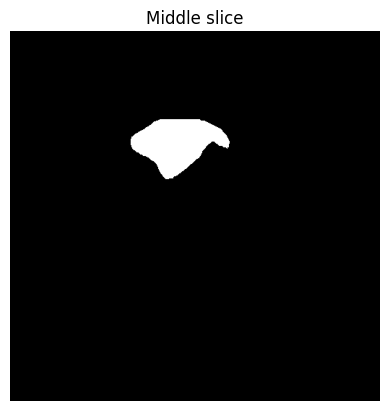

In [11]:
plt.imshow(img_data[:, :, img_data.shape[2] // 2], cmap = 'gray')
plt.title('Middle slice')
plt.axis('off')
plt.show()

### 04.02 Preview Multiple Images

Image data shape: (512, 512, 254)


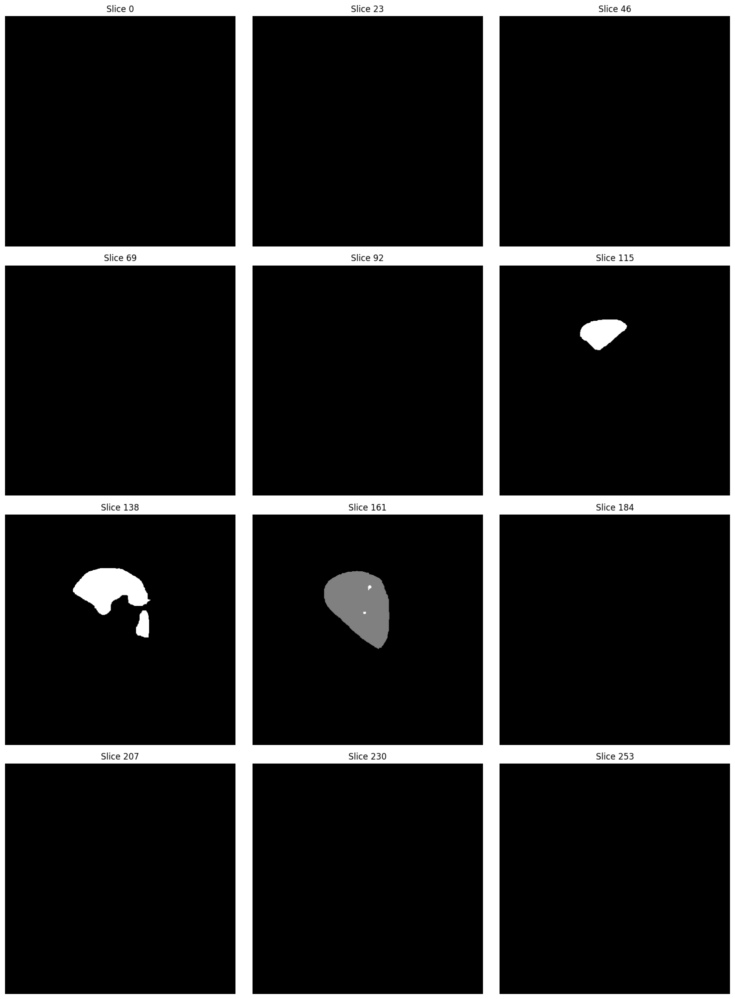

In [12]:
img = nib.load(mask_path)
img_data = img.get_fdata()

print('Image data shape:', img_data.shape)

num_slices = 12
slices = np.linspace(0, img_data.shape[2] - 1, num_slices).astype(int)

num_columns = 3
num_rows = (num_slices + num_columns - 1) // num_columns

plt.figure(figsize = (15, 5 * num_rows))

for i, slice_idx in enumerate(slices):
  plt.subplot(num_rows, num_columns, i + 1)
  plt.imshow(img_data[:, :, slice_idx], cmap = 'gray')
  plt.title(f'Slice {slice_idx}')
  plt.axis('off')

plt.tight_layout()
plt.show()

### 04.03 Preview Selected Image

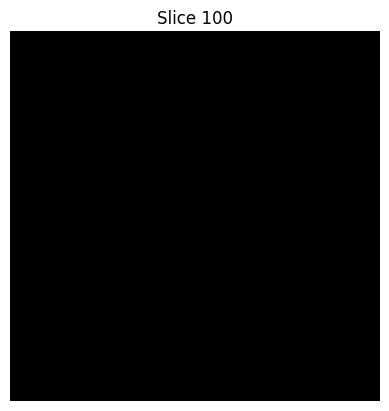

In [13]:
slice_idx = 100
plt.imshow(img_data[:, :, slice_idx], cmap = 'gray')
plt.title(f'Slice {slice_idx}')
plt.axis('off')
plt.show()

### 04.04 Preview as Video

In [14]:
img = nib.load(mask_path)
img_data = img.get_fdata()

height, width, n_frames = img_data.shape
print('Image data shape:', img_data.shape)

output_video = 'output_video.mp4'
fps = 10

fourcc = cv2.VideoWriter_fourcc(*'XVID')
video_writer = cv2.VideoWriter(output_video, fourcc, fps, (width, height), isColor = False)

for i in range(n_frames):
  frame = img_data[:, :, i]
  frame_normalized = cv2.normalize(frame, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
  video_writer.write(frame_normalized)

video_writer.release()
print(f'Video saved as {output_video}')

Image data shape: (512, 512, 254)
Video saved as output_video.mp4


Shape is (num_images, height, width, num_channels) = (254, 512, 512, 3).
Framerate is 10.0 frames/s.


""

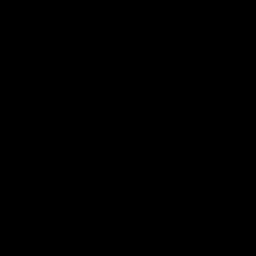

In [15]:
video = media.read_video(output_video)
print(f'Shape is (num_images, height, width, num_channels) = {video.shape}.')
if metadata := video.metadata:
  print(f'Framerate is {metadata.fps} frames/s.')
video2 = media.resize_video(video, tuple(np.array(video.shape[1:3]) // 2))
media.show_video(video2, fps = fps, codec = 'gif')

## 05 Original Preview

In [16]:
ori_path = file_paths[-1]
ori_path

'/content/volume_pt5/volume-49.nii'

### 05.01 File Properties Preview

In [17]:
img = nib.load(ori_path)
img_data = img.get_fdata()

print('Image data shape:', img_data.shape)

header = img.header
print('Header information:', header)

Image data shape: (512, 512, 254)
Header information: <class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 16384
session_error   : 0
regular         : b'r'
dim_info        : 48
dim             : [  3 512 512 254   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [-1.         0.9550781  0.9550781  2.5        0.         0.
  0.         0.       ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 2
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 3071
glmin           : -1024
descrip         : b'time=20160727162303+030;'
aux_file        : b';Philips'
qform_code      : scanner
sform_code      : scanner
quatern_b       : -0.0
quatern_c

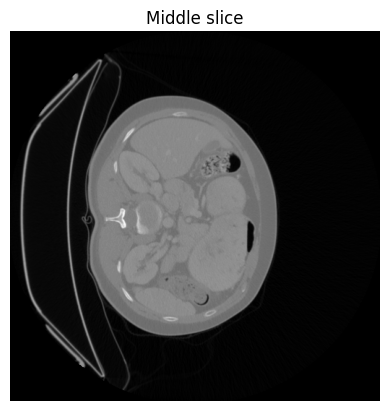

In [18]:
plt.imshow(img_data[:, :, img_data.shape[2] // 2], cmap = 'gray')
plt.title('Middle slice')
plt.axis('off')
plt.show()

### 05.02 Preview Multiple Images

Image data shape: (512, 512, 254)


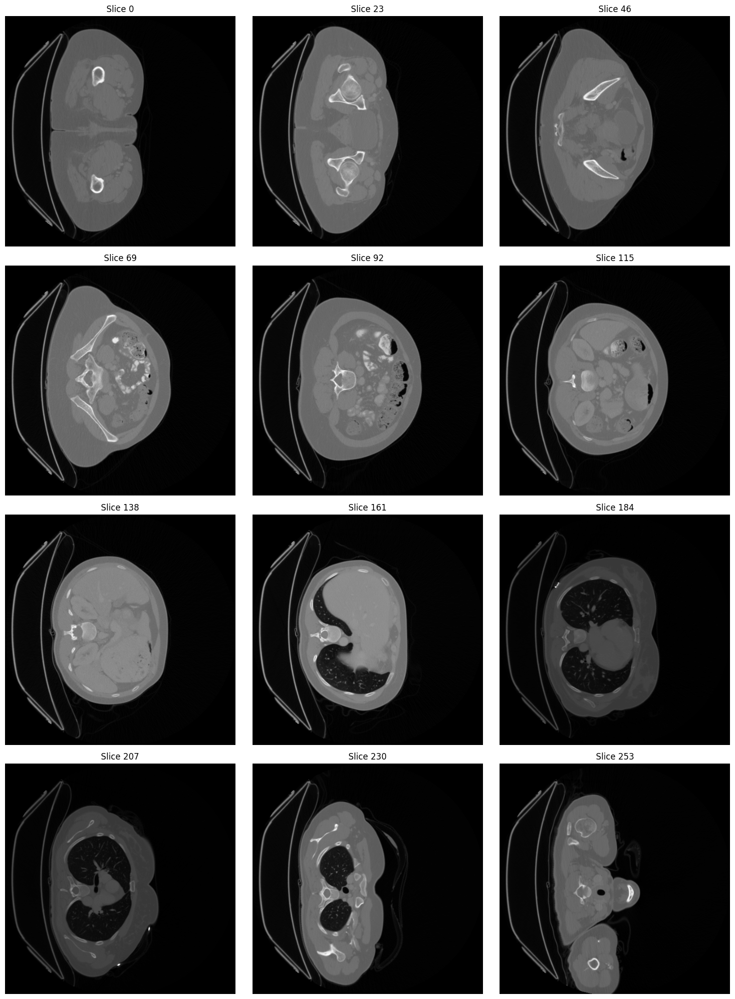

In [19]:
img = nib.load(ori_path)
img_data = img.get_fdata()

print('Image data shape:', img_data.shape)

num_slices = 12
slices = np.linspace(0, img_data.shape[2] - 1, num_slices).astype(int)

num_columns = 3
num_rows = (num_slices + num_columns - 1) // num_columns

plt.figure(figsize = (15, 5 * num_rows))

for i, slice_idx in enumerate(slices):
  plt.subplot(num_rows, num_columns, i + 1)
  plt.imshow(img_data[:, :, slice_idx], cmap = 'gray')
  plt.title(f'Slice {slice_idx}')
  plt.axis('off')

plt.tight_layout()
plt.show()

### 05.03 Preview Selected Image

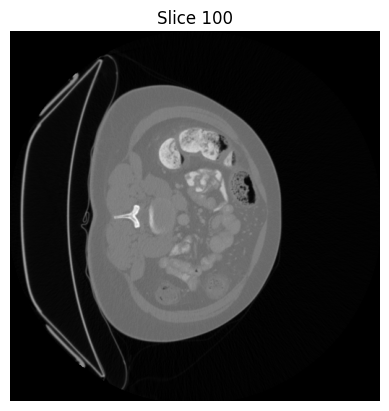

In [20]:
slice_idx = 100
plt.imshow(img_data[:, :, slice_idx], cmap = 'gray')
plt.title(f'Slice {slice_idx}')
plt.axis('off')
plt.show()

### 05.04 Preview as Video

In [21]:
img = nib.load(ori_path)
img_data = img.get_fdata()

height, width, n_frames = img_data.shape
print('Image data shape:', img_data.shape)

output_video = 'output_video.mp4'
fps = 10

fourcc = cv2.VideoWriter_fourcc(*'XVID')
video_writer = cv2.VideoWriter(output_video, fourcc, fps, (width, height), isColor = False)

for i in range(n_frames):
  frame = img_data[:, :, i]
  frame_normalized = cv2.normalize(frame, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
  video_writer.write(frame_normalized)

video_writer.release()
print(f'Video saved as {output_video}')

Image data shape: (512, 512, 254)
Video saved as output_video.mp4


Shape is (num_images, height, width, num_channels) = (254, 512, 512, 3).
Framerate is 10.0 frames/s.


""

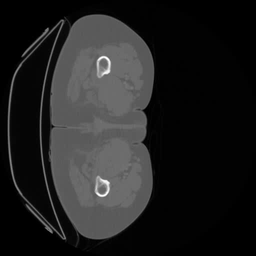

In [22]:
video = media.read_video(output_video)
print(f'Shape is (num_images, height, width, num_channels) = {video.shape}.')
if metadata := video.metadata:
  print(f'Framerate is {metadata.fps} frames/s.')
video2 = media.resize_video(video, tuple(np.array(video.shape[1:3]) // 2))
media.show_video(video2, fps = fps, codec = 'gif')

## 06 Masked Preview

In [23]:
ori_img = nib.load(ori_path)
mask_img = nib.load(mask_path)

ori_data = ori_img.get_fdata()
mask_data = mask_img.get_fdata()

ori_data = (ori_data - np.min(ori_data)) / (np.max(ori_data) - np.min(ori_data))

height, width = ori_data.shape[:2]
fps = 10
output_video_path = 'masked_video.mp4'
ori_opacity = 1
mask_opacity = 0.5

fourcc = cv2.VideoWriter_fourcc(*'XVID')
video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

for i in range(ori_data.shape[2]):
  ori_slice = (ori_data[:, :, i] * 255).astype(np.uint8)
  mask_slice = (mask_data[:, :, i] > 0).astype(np.uint8)

  color_mask = np.zeros((height, width, 3), dtype = np.uint8)
  color_mask[mask_slice == 1] = [255, 0, 0]

  ori_colored = cv2.cvtColor(ori_slice, cv2.COLOR_GRAY2BGR)
  combined_frame = cv2.addWeighted(ori_colored, ori_opacity, color_mask, mask_opacity, 0)
  video_writer.write(combined_frame)

video_writer.release()
print(f"Masked video saved to {output_video_path}")

Masked video saved to masked_video.mp4


Shape is (num_images, height, width, num_channels) = (254, 512, 512, 3).
Framerate is 10.0 frames/s.


""

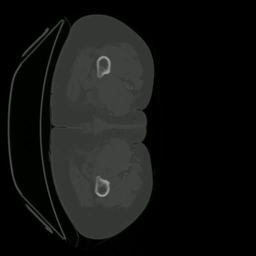

In [24]:
video = media.read_video(output_video_path)
print(f'Shape is (num_images, height, width, num_channels) = {video.shape}.')
if metadata := video.metadata:
  print(f'Framerate is {metadata.fps} frames/s.')
video2 = media.resize_video(video, tuple(np.array(video.shape[1:3]) // 2))
media.show_video(video2, fps = fps, codec = 'gif')